In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [25]:
df5=pd.read_excel('/content/selected_data.xlsx')
df2=df5.copy()

In [26]:
df2.drop(['Count', 'SCANDATE'], axis=1, inplace=True)

###interpolation

In [27]:
import pandas as pd



# Define the target year range (2010 to 2024)
years = pd.DataFrame({'year': range(2010, 2025)})

# Get unique patient IDs (RID) and their corresponding diagnoses
patients = df2[["RID", "DIAGNOSIS"]].drop_duplicates()

# Create a complete grid ensuring each patient (RID) has all years (2010-2024)
complete_grid = patients.merge(years, how="cross")

# Merge the complete grid with the original dataset
df3_filled = complete_grid.merge(df2, on=["RID", "DIAGNOSIS", "year"], how="left")

# Identify numeric columns (excluding categorical ones)
numeric_cols = df2.select_dtypes(include=['number']).columns.difference(["RID", "DIAGNOSIS"])

# **Step 1: Interpolation (Only if enough points exist)**
# def safe_interpolation(group):
#     non_null_count = group.dropna().shape[0]
#     if non_null_count >= 4:
#         return group.interpolate(method="spline", order=3)
#     elif non_null_count >= 3:
#         return group.interpolate(method="polynomial", order=2)
#     else:
#         return group.interpolate(method="linear")  # Fallback to linear

# def safe_interpolation(group):
#   non_null_count = group.dropna().shape[0]
#   if non_null_count >= 3:
#     return group.interpolate(method="spline", order=2)
#   else:
#     return group.interpolate(method='linear')

def safe_interpolation(group):
  return group.interpolate(method='linear')



df3_filled[numeric_cols] = df3_filled.groupby("RID", group_keys=False)[numeric_cols].apply(safe_interpolation)

# **Step 2: Forward-Fill and Backward-Fill where interpolation failed**
df3_filled[numeric_cols] = df3_filled.groupby("RID", group_keys=False)[numeric_cols].apply(lambda group: group.bfill().ffill())


###Check if still we have NAN

In [28]:
for element in df3_filled.columns:
  if df3_filled[element].isnull().sum()!=0:
    print(element)
    print(df3_filled[element].isnull().sum())

LEFT_VESSEL_VOLUME
75
RIGHT_VESSEL_VOLUME
150


##Based on the medical info these two columns are not essential in AD and MCI so I removed them

In [29]:
df4 = df3_filled.copy()
df4.drop(['RIGHT_VESSEL_VOLUME','LEFT_VESSEL_VOLUME'], axis=1, inplace=True)


##Check again for NAN

In [30]:
for element in df4.columns:
  if df4[element].isnull().sum()!=0:
    print(element)
    print(df4[element].isnull().sum())

##Standardization

In [31]:
from sklearn.preprocessing import StandardScaler

In [32]:
# define standard scaler
scaler = StandardScaler()

# transform data
df4.iloc[:,3:] = scaler.fit_transform(df4.iloc[:,3:])

In [ ]:
df4.head()

,RID,DIAGNOSIS,year,SUMMARY_VOLUME,WHOLECEREBELLUM_VOLUME,COMPOSITE_REF_VOLUME,CEREBELLUM_CORTEX_VOLUME,ERODED_SUBCORTICALWM_VOLUME,BRAINSTEM_VOLUME,CC_ANTERIOR_VOLUME,...,RIGHT_CEREBELLUM_WHITE_MATTER_VOLUME,RIGHT_CEREBRAL_WHITE_MATTER_VOLUME,RIGHT_CHOROID_PLEXUS_VOLUME,RIGHT_HIPPOCAMPUS_VOLUME,RIGHT_INF_LAT_VENT_VOLUME,RIGHT_LATERAL_VENTRICLE_VOLUME,RIGHT_PALLIDUM_VOLUME,RIGHT_PUTAMEN_VOLUME,RIGHT_THALAMUS_PROPER_VOLUME,RIGHT_VENTRALDC_VOLUME
0,4637,1,2010,0.098849,-0.994383,-0.384181,-0.768724,-0.046581,-1.578550,0.140773,...,-1.212616,-0.377014,-0.931600,0.132256,-0.749577,-0.916952,-1.268909,-0.317572,-0.684637,-1.245302
1,4637,1,2011,0.098849,-0.994383,-0.384181,-0.768724,-0.046581,-1.578550,0.140773,...,-1.212616,-0.377014,-0.931600,0.132256,-0.749577,-0.916952,-1.268909,-0.317572,-0.684637,-1.245302
2,4637,1,2012,0.098849,-0.994383,-0.384181,-0.768724,-0.046581,-1.578550,0.140773,...,-1.212616,-0.377014,-0.931600,0.132256,-0.749577,-0.916952,-1.268909,-0.317572,-0.684637,-1.245302
3,4637,1,2013,-0.050193,-1.044105,-0.407712,-0.867649,-0.054170,-1.660458,0.122373,...,-1.163641,-0.358780,-0.839786,0.054527,-0.717727,-0.826815,-1.268909,-0.368440,-0.912285,-1.203692
4,4637,1,2014,-0.199235,-1.093827,-0.431242,-0.966573,-0.061759,-1.742365,0.103973,...,-1.114667,-0.340546,-0.747972,-0.023202,-0.685878,-0.736678,-1.268909,-0.419308,-1.139933,-1.162081


In [ ]:
df=df4.copy()

### Plot mean for each features across three class
##class 1 = CL
##Class 2 = MCI
##Class 3 = AD

<ipython-input-33-7dd58af896bd>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  summary_stats.reset_index(inplace=True)  # Reset index for easier plotting
<ipython-input-33-7dd58af896bd>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  summary_stats.reset_index(inplace=True)  # Reset index for easier plotting


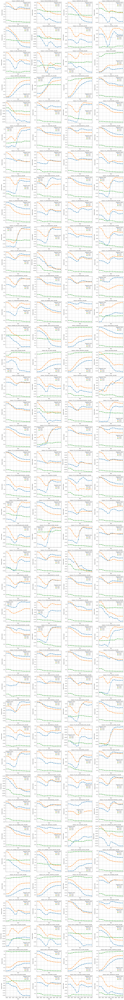

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Convert 'year' column to numeric format
df['year'] = pd.to_datetime(df['year'], format='%Y').dt.year

# Select feature columns (excluding RID, DIAGNOSIS, year)
feature_columns = [col for col in df.columns if col not in ['RID', 'DIAGNOSIS', 'year']]

# Compute Summary Statistics
summary_stats = df.groupby(['year', 'DIAGNOSIS'])[feature_columns].agg(['mean', 'std'])
summary_stats.columns = ['_'.join(col).strip() for col in summary_stats.columns]  # Flatten column names
summary_stats.reset_index(inplace=True)  # Reset index for easier plotting

# Define number of rows and columns based on total features
num_features = len(feature_columns)
nrows = int(np.ceil(num_features / 4))  # 4 columns per row
ncols = 4

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, nrows * 4), sharex=True)
axes = axes.flatten()  # Flatten the 2D array for easy indexing

# Define a distinct color palette for the classes
palette = sns.color_palette("tab10", len(df['DIAGNOSIS'].unique()))

# Loop through selected features and plot all classes in the same subplot
for feature_idx, feature in enumerate(feature_columns):
    ax = axes[feature_idx]  # Select the correct subplot

    for class_idx, diagnosis in enumerate(sorted(df['DIAGNOSIS'].unique())):
        subset = summary_stats[summary_stats['DIAGNOSIS'] == diagnosis]
        mean_values = subset[f"{feature}_mean"]
        std_values = subset[f"{feature}_std"]

        # Plot only the mean (without shaded area)
        ax.plot(subset['year'], mean_values, marker='o', linestyle='-', color=palette[class_idx], label=f"Class {diagnosis}")

    ax.set_title(f"Feature: {feature}", fontsize=10)
    ax.set_xlabel("Year")
    ax.set_ylabel("Feature Value")
    ax.legend(title="Diagnosis Class", fontsize=8)
    ax.grid(True)

# Hide empty subplots if any
for i in range(feature_idx + 1, len(axes)):
    fig.delaxes(axes[i])

# Adjust layout for better spacing
plt.tight_layout()
plt.show()
fig.savefig('mean_features.png')


###Plot mean along with std error for each feature and class

<ipython-input-34-9a9f836fb610>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  summary_stats.reset_index(inplace=True)  # Reset index for easier plotting
<ipython-input-34-9a9f836fb610>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  summary_stats.reset_index(inplace=True)  # Reset index for easier plotting


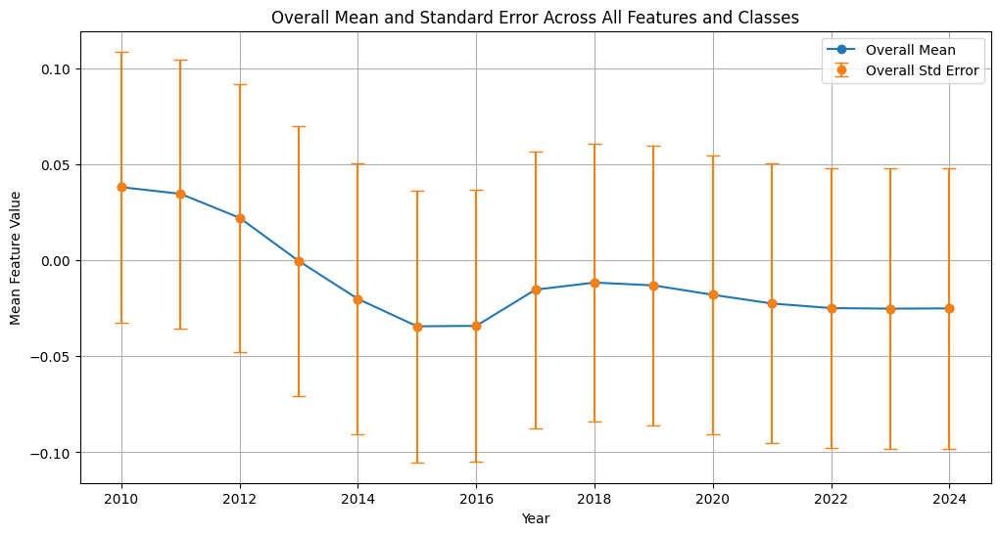

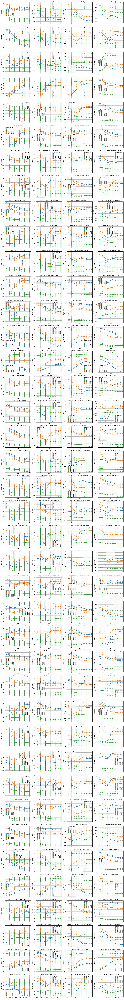

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Convert 'year' column to numeric format
df['year'] = pd.to_datetime(df['year'], format='%Y').dt.year

# Select feature columns (excluding RID, DIAGNOSIS, year)
feature_columns = [col for col in df.columns if col not in ['RID', 'DIAGNOSIS', 'year']]

# Compute Summary Statistics
summary_stats = df.groupby(['year', 'DIAGNOSIS'])[feature_columns].agg(['mean', 'std', 'count'])
summary_stats.columns = ['_'.join(col).strip() for col in summary_stats.columns]  # Flatten column names
summary_stats.reset_index(inplace=True)  # Reset index for easier plotting

# Compute Overall Mean and Standard Error Across All Features and Classes
overall_stats = summary_stats.groupby('year').mean().reset_index()
overall_mean = overall_stats[[col for col in overall_stats.columns if '_mean' in col]].mean(axis=1)
overall_std = overall_stats[[col for col in overall_stats.columns if '_std' in col]].mean(axis=1)
overall_count = overall_stats[[col for col in overall_stats.columns if '_count' in col]].mean(axis=1)
overall_std_error = overall_std / np.sqrt(overall_count)

# Plot Overall Mean and Standard Error
plt.figure(figsize=(12, 6))
plt.plot(overall_stats['year'], overall_mean, marker='o', linestyle='-', label="Overall Mean")
plt.errorbar(overall_stats['year'], overall_mean, yerr=overall_std_error, fmt='o', capsize=5, label="Overall Std Error")

plt.title("Overall Mean and Standard Error Across All Features and Classes")
plt.xlabel("Year")
plt.ylabel("Mean Feature Value")
plt.legend()
plt.grid(True)
plt.show()

# Define number of rows and columns based on total features
num_features = len(feature_columns)
nrows = int(np.ceil(num_features / 4))  # 4 columns per row
ncols = 4

# Create subplots
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, nrows * 4), sharex=True)
axes = axes.flatten()  # Flatten the 2D array for easy indexing

# Define a distinct color palette for the classes
palette = sns.color_palette("tab10", len(df['DIAGNOSIS'].unique()))

# Loop through selected features and plot all classes in the same subplot
for feature_idx, feature in enumerate(feature_columns):
    ax = axes[feature_idx]  # Select the correct subplot

    for class_idx, diagnosis in enumerate(sorted(df['DIAGNOSIS'].unique())):
        subset = summary_stats[summary_stats['DIAGNOSIS'] == diagnosis]
        mean_values = subset[f"{feature}_mean"]
        std_values = subset[f"{feature}_std"]
        count_values = subset[f"{feature}_count"]
        std_error = std_values / np.sqrt(count_values)

        # Plot mean values
        ax.plot(subset['year'], mean_values, marker='o', linestyle='-', color=palette[class_idx], label=f"Class {diagnosis}")

        # Plot standard error as shaded region
        ax.errorbar(subset['year'], mean_values, yerr=std_error, fmt='o', capsize=5, color=palette[class_idx], label=f"Class {diagnosis} - Std Error")

    ax.set_title(f"Feature: {feature}", fontsize=10)
    ax.set_xlabel("Year")
    ax.set_ylabel("Feature Value")
    ax.legend(title="Diagnosis Class", fontsize=8)
    ax.grid(True)

# Hide empty subplots if any
for i in range(feature_idx + 1, len(axes)):
    fig.delaxes(axes[i])

# Adjust layout for better spacing
plt.tight_layout()
plt.show()
fig.savefig('mean_stderr_features.png')



###Mean for classes across all features

<ipython-input-35-20469a4a01be>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  summary_stats.reset_index(inplace=True)  # Reset index for easier plotting
<ipython-input-35-20469a4a01be>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  summary_stats.reset_index(inplace=True)  # Reset index for easier plotting
<ipython-input-35-20469a4a01be>:24: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once 

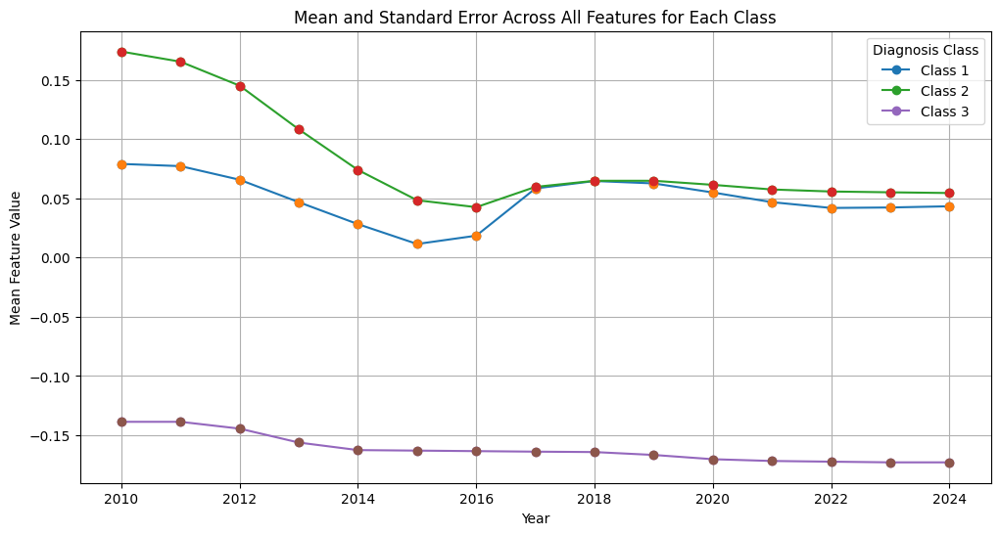

<Figure size 640x480 with 0 Axes>

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Convert 'year' column to numeric format
df['year'] = pd.to_datetime(df['year'], format='%Y').dt.year

# Select feature columns (excluding RID, DIAGNOSIS, year)
feature_columns = [col for col in df.columns if col not in ['RID', 'DIAGNOSIS', 'year']]

# Compute Summary Statistics
summary_stats = df.groupby(['year', 'DIAGNOSIS'])[feature_columns].agg(['mean', 'std', 'count'])
summary_stats.columns = ['_'.join(col).strip() for col in summary_stats.columns]  # Flatten column names
summary_stats.reset_index(inplace=True)  # Reset index for easier plotting

# Compute Mean and Standard Error for Each Class Across All Features
class_means = summary_stats.groupby(['year', 'DIAGNOSIS'])[[col for col in summary_stats.columns if '_mean' in col]].mean()
class_stds = summary_stats.groupby(['year', 'DIAGNOSIS'])[[col for col in summary_stats.columns if '_std' in col]].mean()
class_counts = summary_stats.groupby(['year', 'DIAGNOSIS'])[[col for col in summary_stats.columns if '_count' in col]].mean()
class_std_errors = class_stds / np.sqrt(class_counts)

# Reset index for easier plotting
class_means.reset_index(inplace=True)
class_std_errors.reset_index(inplace=True)

# Plot Mean and Standard Error for Each Class
plt.figure(figsize=(12, 6))
for class_idx, diagnosis in enumerate(sorted(df['DIAGNOSIS'].unique())):
    subset = class_means[class_means['DIAGNOSIS'] == diagnosis]
    subset_std_error = class_std_errors[class_std_errors['DIAGNOSIS'] == diagnosis]
    mean_values = subset.drop(columns=['year', 'DIAGNOSIS']).mean(axis=1)
    std_error_values = subset_std_error.drop(columns=['year', 'DIAGNOSIS']).mean(axis=1)

    plt.plot(subset['year'], mean_values, marker='o', linestyle='-', label=f"Class {diagnosis}")
    plt.errorbar(subset['year'], mean_values, yerr=std_error_values, fmt='o', capsize=5)

plt.title("Mean and Standard Error Across All Features for Each Class")
plt.xlabel("Year")
plt.ylabel("Mean Feature Value")
plt.legend(title="Diagnosis Class")
plt.grid(True)
plt.show()
#plt.savefig('general_mean.png')



###Plot mean for 3 selected patients from different classes

Columns after aggregation: MultiIndex([(                          'year',     ''),
            (                           'RID',     ''),
            (                'SUMMARY_VOLUME', 'mean'),
            (                'SUMMARY_VOLUME',  'std'),
            (        'WHOLECEREBELLUM_VOLUME', 'mean'),
            (        'WHOLECEREBELLUM_VOLUME',  'std'),
            (          'COMPOSITE_REF_VOLUME', 'mean'),
            (          'COMPOSITE_REF_VOLUME',  'std'),
            (      'CEREBELLUM_CORTEX_VOLUME', 'mean'),
            (      'CEREBELLUM_CORTEX_VOLUME',  'std'),
            ...
            ('RIGHT_LATERAL_VENTRICLE_VOLUME', 'mean'),
            ('RIGHT_LATERAL_VENTRICLE_VOLUME',  'std'),
            (         'RIGHT_PALLIDUM_VOLUME', 'mean'),
            (         'RIGHT_PALLIDUM_VOLUME',  'std'),
            (          'RIGHT_PUTAMEN_VOLUME', 'mean'),
            (          'RIGHT_PUTAMEN_VOLUME',  'std'),
            (  'RIGHT_THALAMUS_PROPER_VOLUME', 'mean'),
     

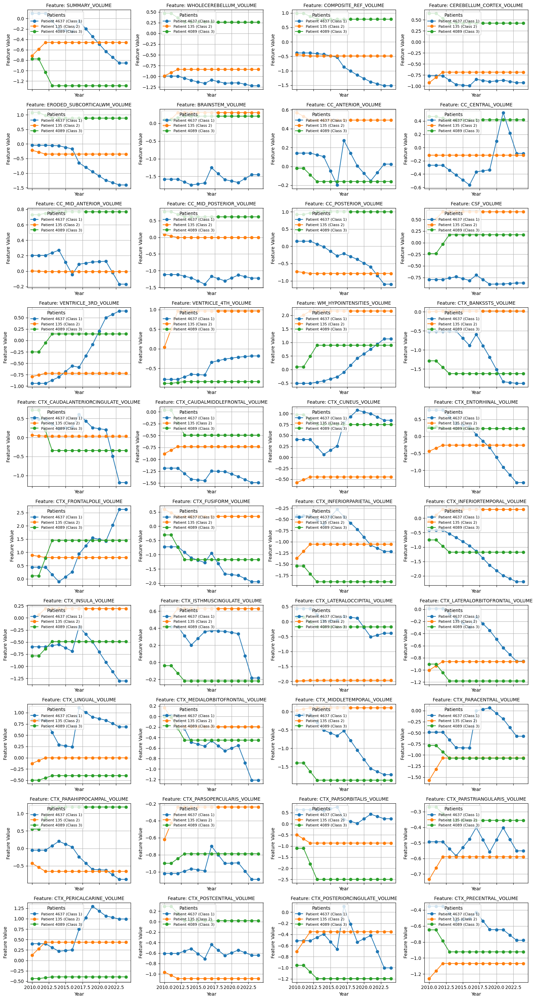

<Figure size 640x480 with 0 Axes>

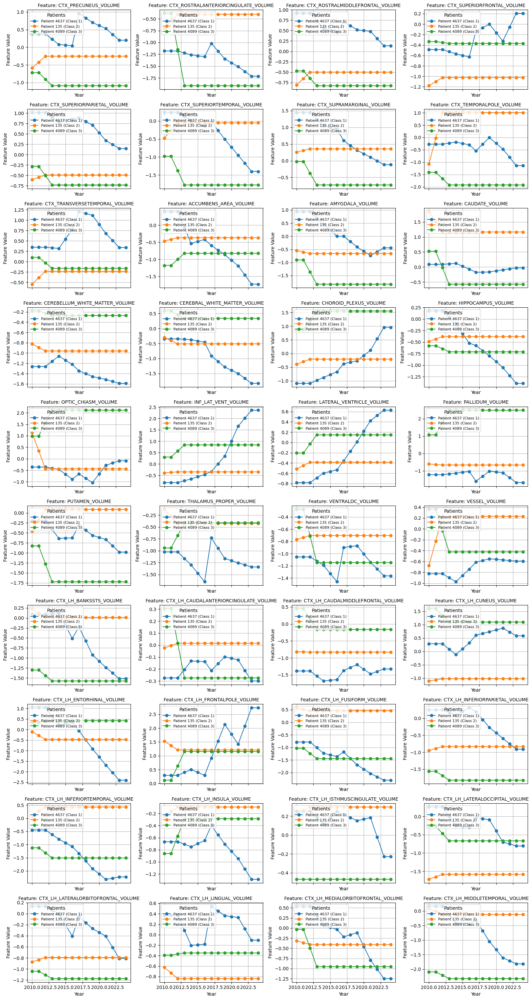

<Figure size 640x480 with 0 Axes>

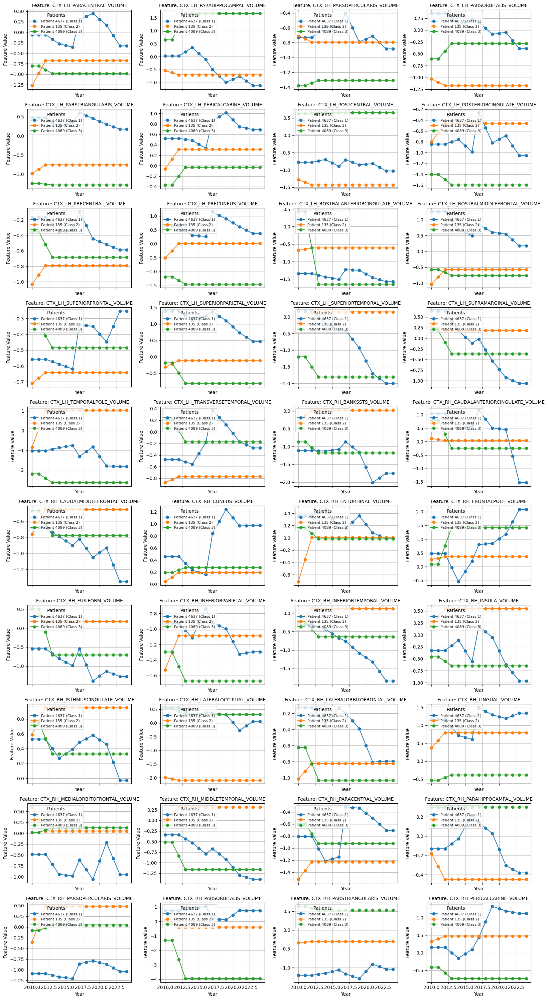

<Figure size 640x480 with 0 Axes>

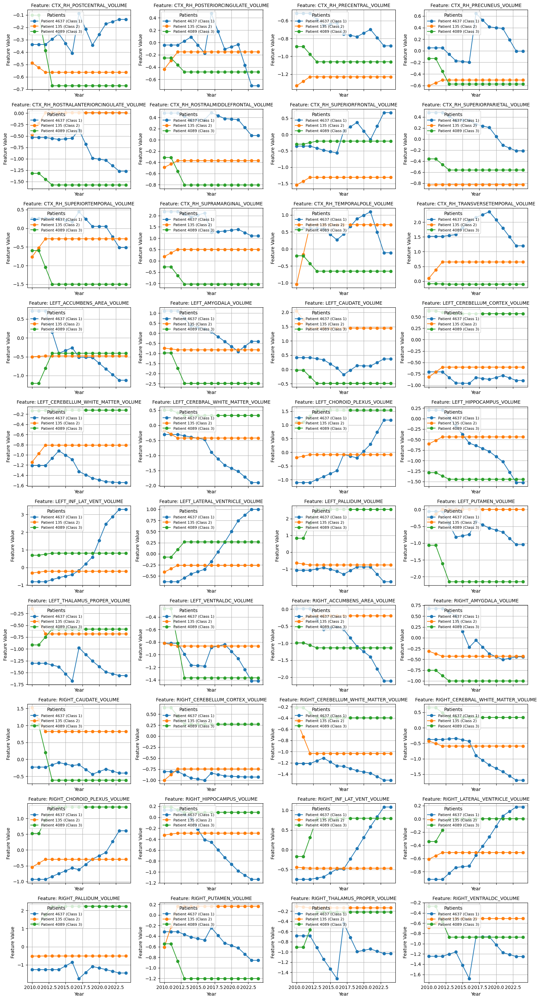

<Figure size 640x480 with 0 Axes>

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Convert 'year' column to numeric format
df['year'] = pd.to_datetime(df['year'], format='%Y').dt.year

# Select feature columns (excluding RID, DIAGNOSIS, year)
feature_columns = [col for col in df.columns if col not in ['RID', 'DIAGNOSIS', 'year']]

# Select one patient from each class
selected_patients = df.groupby('DIAGNOSIS')['RID'].first().values
patient_data = df[df['RID'].isin(selected_patients)]

# Compute mean and standard deviation for each patient
patient_stats = patient_data.groupby(['year', 'RID'])[feature_columns].agg(['mean', 'std']).reset_index()
print('Columns after aggregation:', patient_stats.columns)  # Debugging step
patient_stats.columns = ['{}_{}'.format(col[0], col[1]) if isinstance(col, tuple) and col[1] else col[0] for col in patient_stats.columns]

# Define batch size for plotting
batch_size = 40  # Number of features per figure
num_batches = int(np.ceil(len(feature_columns) / batch_size))

# Loop through batches of features
for batch in range(num_batches):
    start_idx = batch * batch_size
    end_idx = min((batch + 1) * batch_size, len(feature_columns))
    batch_features = feature_columns[start_idx:end_idx]

    # Define number of rows and columns for subplots
    nrows = int(np.ceil(len(batch_features) / 4))  # 4 columns per row
    ncols = 4

    # Create subplots
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, nrows * 3), sharex=True)
    axes = axes.flatten()

    # Loop through each feature in the batch and plot for selected patients
    for feature_idx, feature in enumerate(batch_features):
        ax = axes[feature_idx]
        for class_idx, (rid, diagnosis) in enumerate(zip(selected_patients, sorted(df['DIAGNOSIS'].unique()))):
            patient_subset = patient_stats[patient_stats['RID'].astype(str) == str(rid)]
            mean_values = patient_subset[f"{feature}_mean"]
            std_values = patient_subset[f"{feature}_std"]

            ax.plot(patient_subset['year'], mean_values, marker='o', linestyle='-', label=f"Patient {rid} (Class {diagnosis})")


        ax.set_title(f"Feature: {feature}", fontsize=10)
        ax.set_xlabel("Year")
        ax.set_ylabel("Feature Value")
        ax.legend(title="Patients", loc='upper left', fontsize=8, frameon=True)
        ax.grid(True)

    # Hide empty subplots if any
    for i in range(len(batch_features), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()
    plt.close(fig)  # Close figure to free memory
    #plt.savefig('three_patients_mean_features.png')


###PLot mean wwith std error for classes across all features

<ipython-input-18-be00f0baf09d>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  summary_stats.reset_index(inplace=True)  # Reset index for easier plotting
<ipython-input-18-be00f0baf09d>:15: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  summary_stats.reset_index(inplace=True)  # Reset index for easier plotting


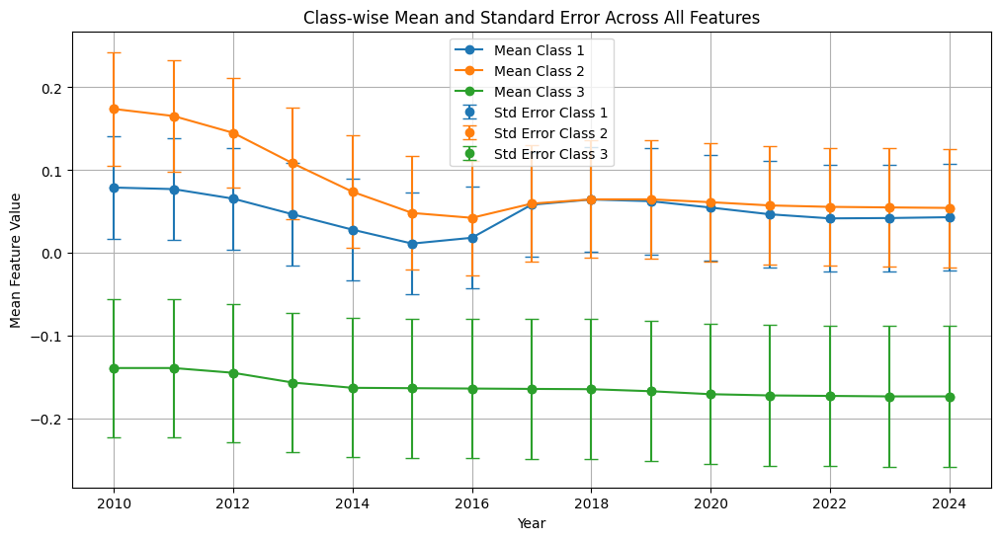

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Convert 'year' column to numeric format
df['year'] = pd.to_datetime(df['year'], format='%Y').dt.year

# Select feature columns (excluding RID, DIAGNOSIS, year)
feature_columns = [col for col in df.columns if col not in ['RID', 'DIAGNOSIS', 'year']]

# Compute Summary Statistics
summary_stats = df.groupby(['year', 'DIAGNOSIS'])[feature_columns].agg(['mean', 'std', 'count'])
summary_stats.columns = ['_'.join(col).strip() for col in summary_stats.columns]  # Flatten column names
summary_stats.reset_index(inplace=True)  # Reset index for easier plotting

# Compute Mean and Standard Error for Each Class
class_means = {}
class_std_errors = {}

for diagnosis in sorted(df['DIAGNOSIS'].unique()):
    class_stats = summary_stats[summary_stats['DIAGNOSIS'] == diagnosis]
    class_mean = class_stats[[col for col in class_stats.columns if '_mean' in col]].mean(axis=1)
    class_std = class_stats[[col for col in class_stats.columns if '_std' in col]].mean(axis=1)
    class_count = class_stats[[col for col in class_stats.columns if '_count' in col]].mean(axis=1)
    class_std_error = class_std / np.sqrt(class_count)

    class_means[diagnosis] = class_mean
    class_std_errors[diagnosis] = class_std_error

# Plot Mean and Standard Error for Each Class
plt.figure(figsize=(12, 6))
palette = sns.color_palette("tab10", len(df['DIAGNOSIS'].unique()))

for idx, diagnosis in enumerate(sorted(df['DIAGNOSIS'].unique())):
    plt.plot(summary_stats[summary_stats['DIAGNOSIS'] == diagnosis]['year'], class_means[diagnosis],
             marker='o', linestyle='-', label=f"Mean Class {diagnosis}", color=palette[idx])
    plt.errorbar(summary_stats[summary_stats['DIAGNOSIS'] == diagnosis]['year'], class_means[diagnosis],
                 yerr=class_std_errors[diagnosis], fmt='o', capsize=5, label=f"Std Error Class {diagnosis}", color=palette[idx])

plt.title("Class-wise Mean and Standard Error Across All Features")
plt.xlabel("Year")
plt.ylabel("Mean Feature Value")
plt.legend()
plt.grid(True)
plt.show()
#plt.savefig('general_mean_stderr.png')

### I tried to find the most important features from the medical aspect to plot them . I have three category, highly more important, moderate important and low important

In [ ]:
# Highly Important Features (Strongest Biomarkers for AD and MCI)
highly_important_features = [
    "SUMMARY_VOLUME", "HIPPOCAMPUS_VOLUME", "CEREBRAL_WHITE_MATTER_VOLUME",
    "LATERAL_VENTRICLE_VOLUME", "INF_LAT_VENT_VOLUME", "CSF_VOLUME",
    "VENTRICLE_3RD_VOLUME", "VENTRICLE_4TH_VOLUME", "BRAINSTEM_VOLUME",
    "LEFT_HIPPOCAMPUS_VOLUME", "RIGHT_HIPPOCAMPUS_VOLUME",
    "LEFT_LATERAL_VENTRICLE_VOLUME", "RIGHT_LATERAL_VENTRICLE_VOLUME",
    "LEFT_INF_LAT_VENT_VOLUME", "RIGHT_INF_LAT_VENT_VOLUME",
    "WHOLECEREBELLUM_VOLUME"
]

# Moderately Important Features (Supportive Biomarkers)
moderately_important_features = [
    "THALAMUS_PROPER_VOLUME", "LEFT_THALAMUS_PROPER_VOLUME", "RIGHT_THALAMUS_PROPER_VOLUME",
    "AMYGDALA_VOLUME", "CAUDATE_VOLUME", "PALLIDUM_VOLUME", "PUTAMEN_VOLUME", "VENTRALDC_VOLUME",
    "CHOROID_PLEXUS_VOLUME", "CEREBELLUM_WHITE_MATTER_VOLUME",
    "LEFT_AMYGDALA_VOLUME", "RIGHT_AMYGDALA_VOLUME",
    "LEFT_CAUDATE_VOLUME", "RIGHT_CAUDATE_VOLUME", "LEFT_PALLIDUM_VOLUME", "RIGHT_PALLIDUM_VOLUME",
    "LEFT_PUTAMEN_VOLUME", "RIGHT_PUTAMEN_VOLUME", "LEFT_VENTRALDC_VOLUME", "RIGHT_VENTRALDC_VOLUME",
    "LEFT_CHOROID_PLEXUS_VOLUME", "RIGHT_CHOROID_PLEXUS_VOLUME",
    "LEFT_CEREBELLUM_WHITE_MATTER_VOLUME", "RIGHT_CEREBELLUM_WHITE_MATTER_VOLUME",
    "LEFT_CEREBRAL_WHITE_MATTER_VOLUME", "RIGHT_CEREBRAL_WHITE_MATTER_VOLUME",
    "CC_ANTERIOR_VOLUME", "CC_CENTRAL_VOLUME", "CC_MID_ANTERIOR_VOLUME",
    "CC_MID_POSTERIOR_VOLUME", "CC_POSTERIOR_VOLUME"
]

# Low Importance Features (Minimal or Indirect Relevance)
low_important_features = [
    "ERODED_SUBCORTICALWM_VOLUME", "COMPOSITE_REF_VOLUME", "CEREBELLUM_CORTEX_VOLUME",
    "CTX_BANKSSTS_VOLUME", "CTX_CAUDALANTERIORCINGULATE_VOLUME", "CTX_CAUDALMIDDLEFRONTAL_VOLUME",
    "CTX_CUNEUS_VOLUME", "CTX_FRONTALPOLE_VOLUME", "CTX_FUSIFORM_VOLUME",
    "CTX_INFERIORPARIETAL_VOLUME", "CTX_INFERIORTEMPORAL_VOLUME", "CTX_INSULA_VOLUME",
    "CTX_ISTHMUSCINGULATE_VOLUME", "CTX_LATERALOCCIPITAL_VOLUME", "CTX_LATERALORBITOFRONTAL_VOLUME",
    "CTX_LINGUAL_VOLUME", "CTX_MEDIALORBITOFRONTAL_VOLUME", "CTX_MIDDLETEMPORAL_VOLUME",
    "CTX_PARACENTRAL_VOLUME", "CTX_PARAHIPPOCAMPAL_VOLUME", "CTX_PARSOPERCULARIS_VOLUME",
    "CTX_PARSORBITALIS_VOLUME", "CTX_PARSTRIANGULARIS_VOLUME", "CTX_PERICALCARINE_VOLUME",
    "CTX_POSTCENTRAL_VOLUME", "CTX_POSTERIORCINGULATE_VOLUME", "CTX_PRECENTRAL_VOLUME",
    "CTX_PRECUNEUS_VOLUME", "CTX_ROSTRALANTERIORCINGULATE_VOLUME", "CTX_ROSTRALMIDDLEFRONTAL_VOLUME",
    "CTX_SUPERIORFRONTAL_VOLUME", "CTX_SUPERIORPARIETAL_VOLUME", "CTX_SUPERIORTEMPORAL_VOLUME",
    "CTX_SUPRAMARGINAL_VOLUME", "CTX_TEMPORALPOLE_VOLUME", "CTX_TRANSVERSETEMPORAL_VOLUME",
    "LEFT_ACCUMBENS_AREA_VOLUME", "RIGHT_ACCUMBENS_AREA_VOLUME", "LEFT_CEREBELLUM_CORTEX_VOLUME",
    "RIGHT_CEREBELLUM_CORTEX_VOLUME","OPTIC_CHIASM_VOLUME"
]


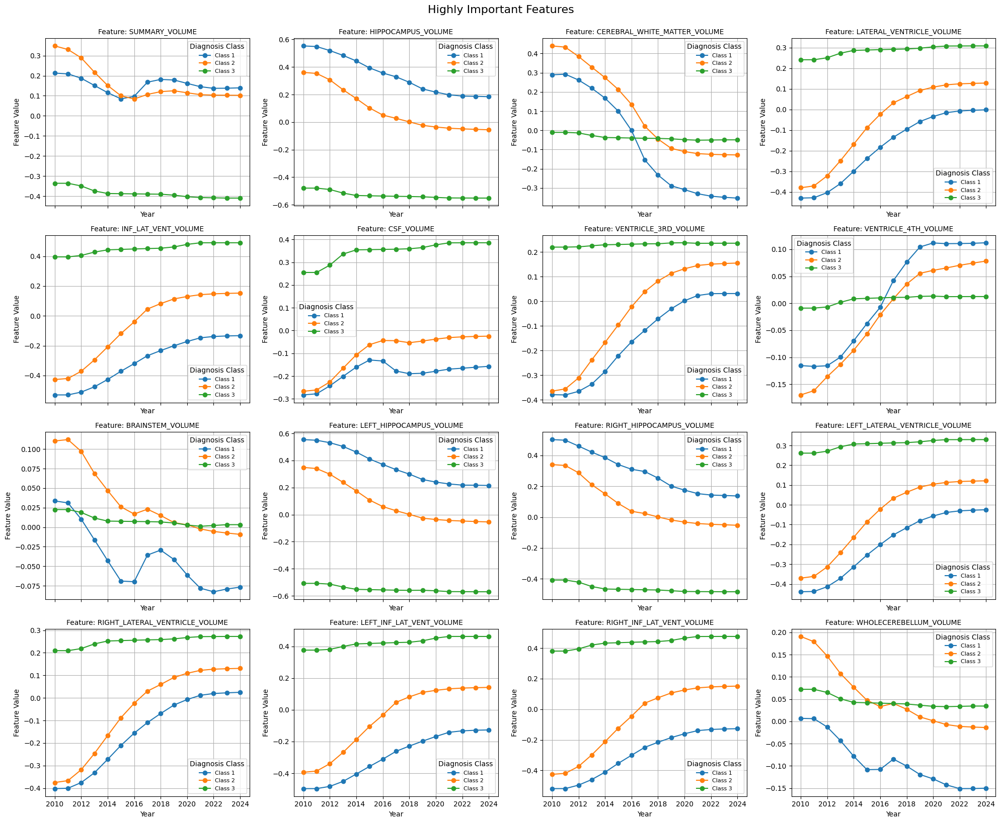

<Figure size 640x480 with 0 Axes>

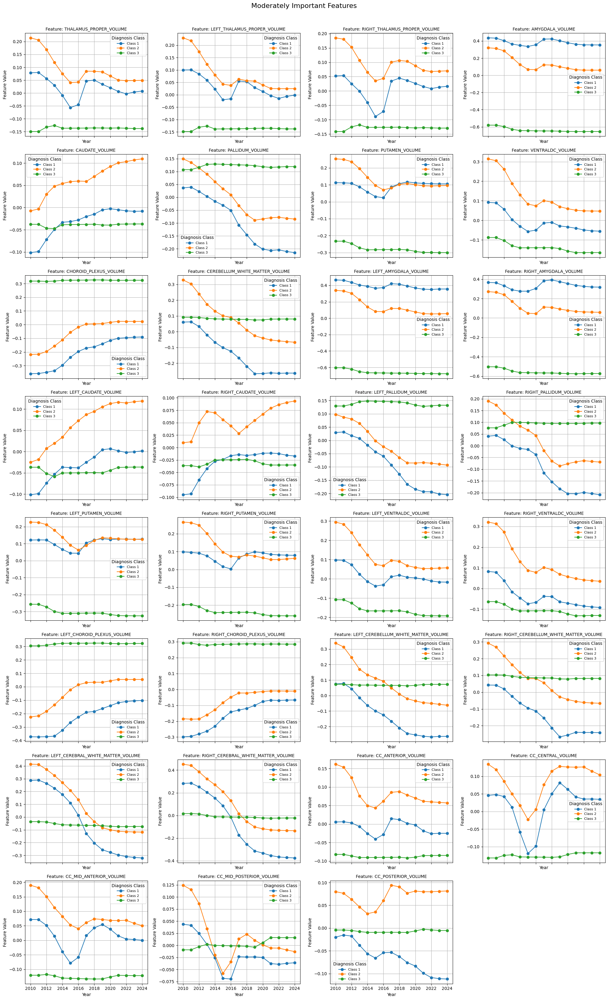

<Figure size 640x480 with 0 Axes>

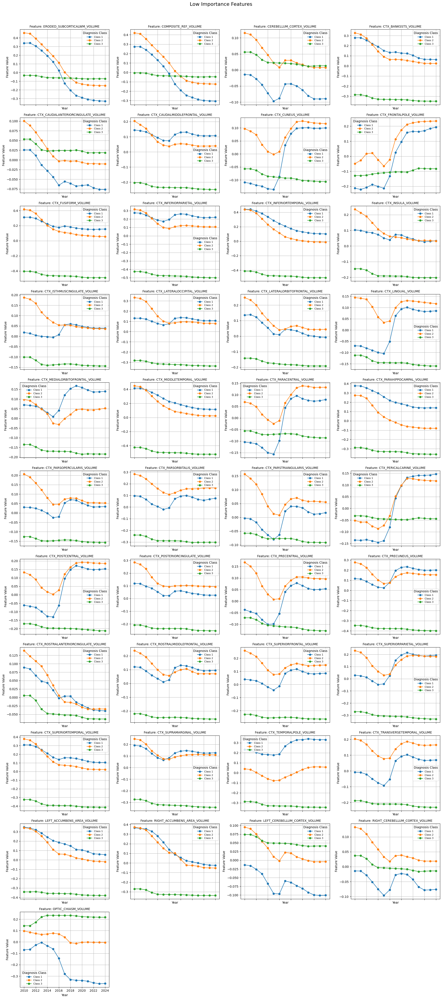

<Figure size 640x480 with 0 Axes>

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Convert 'year' column to numeric format
df['year'] = pd.to_datetime(df['year'], format='%Y').dt.year

# Compute Summary Statistics
feature_columns = highly_important_features + moderately_important_features + low_important_features
summary_stats = df.groupby(['year', 'DIAGNOSIS'])[feature_columns].agg(['mean', 'std'])
summary_stats.columns = ['_'.join(col).strip() for col in summary_stats.columns]  # Flatten column names
summary_stats.reset_index(inplace=True)  # Reset index for easier plotting

# Define function for plotting feature groups
def plot_feature_group(features, title, filename):
    num_features = len(features)
    nrows = int(np.ceil(num_features / 4))  # 4 columns per row
    ncols = min(num_features, 4)  # Ensure ncols doesn't exceed available features

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, nrows * 4), sharex=True)
    axes = np.array(axes).flatten()  # Flatten the 2D array for easy indexing

    # Define color palette
    palette = sns.color_palette("tab10", len(df['DIAGNOSIS'].unique()))

    # Loop through features and plot
    for feature_idx, feature in enumerate(features):
        ax = axes[feature_idx]  # Select the correct subplot

        for class_idx, diagnosis in enumerate(sorted(df['DIAGNOSIS'].unique())):
            subset = summary_stats[summary_stats['DIAGNOSIS'] == diagnosis]
            mean_values = subset[f"{feature}_mean"]
            std_values = subset[f"{feature}_std"]

            # Plot mean values
            ax.plot(subset['year'], mean_values, marker='o', linestyle='-', color=palette[class_idx], label=f"Class {diagnosis}")

        ax.set_title(f"Feature: {feature}", fontsize=10)
        ax.set_xlabel("Year")
        ax.set_ylabel("Feature Value")
        ax.legend(title="Diagnosis Class", fontsize=8)
        ax.grid(True)

    # Hide empty subplots if any
    for i in range(feature_idx + 1, len(axes)):
        fig.delaxes(axes[i])

    # Adjust layout and save figure
    plt.tight_layout()
    plt.suptitle(title, fontsize=16, y=1.02)
    plt.show()
    fig.savefig(filename)

# Plot each feature group separately
plot_feature_group(highly_important_features, "Highly Important Features", "highly_important_features.png")
#plt.savefig('highly_important_features.png')
plot_feature_group(moderately_important_features, "Moderately Important Features", "moderately_important_features.png")
#plt.savefig('moderately_important_features.png')
plot_feature_group(low_important_features, "Low Importance Features", "low_important_features.png")
#plt.savefig('low_important_features.png')
